In [1]:

# This filters any outputs from libraries that we don't want to see, and clear_output removes any outputs generated by a cell
from IPython.display import clear_output
import warnings
warnings.filterwarnings('ignore')
clear_output()

In [2]:
import numpy as np
import pandas as pd

# Visualisation libraries
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import missingno as msno #For missing value visualization

# From here: https://www.tutorialspoint.com/plotly/plotly_plotting_inline_with_jupyter_notebook.htm
import plotly.offline as py
py.init_notebook_mode(connected=True)

import time

import re
import string

In [3]:
data = pd.read_csv('../data-collection/tracks_with_features_demo.csv')
data.head()

,id,name,artists_ids,album,preview_url,duration_ms,popularity,explicit,artist_names,artist_genres,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,0V3wPSX9ygBnCm8psDIegu,Anti-Hero,06HL4z0CvFAxyc27GXpf02,Midnights,https://p.scdn.co/mp3-preview/d618210939db5375...,200690,97,False,Taylor Swift,pop,...,4,-6.571,1,0.0519,0.1300,0.000002,0.1420,0.533,97.008,4
1,1Qrg8KqiBpW07V7PNxwwwL,Kill Bill,7tYKF4w9nC0nq9CsPZTHyP,SOS,https://p.scdn.co/mp3-preview/6da21541af45fb6b...,153946,74,False,SZA,pop/r&b,...,8,-5.747,1,0.0391,0.0521,0.144000,0.1610,0.418,88.980,4
2,2dHHgzDwk4BJdRwy9uXhTO,Creepin' (with The Weeknd & 21 Savage),0iEtIxbK0KxaSlF7G42ZOp/1Xyo4u8uXC1ZmMpatF05PJ/...,HEROES & VILLAINS,https://p.scdn.co/mp3-preview/c5e0da24d37a1e39...,221520,90,True,Metro Boomin/The Weeknd/21 Savage,rap/canadian contemporary r&b/canadian pop/pop...,...,1,-6.005,0,0.0484,0.4170,0.000000,0.0822,0.172,97.950,4
3,3nqQXoyQOWXiESFLlDF1hG,Unholy (feat. Kim Petras),2wY79sveU1sp5g7SokKOiI/3Xt3RrJMFv5SZkCfUE8C1J,Unholy (feat. Kim Petras),https://p.scdn.co/mp3-preview/9ad533082a26a9c0...,156943,100,False,Sam Smith/Kim Petras,dance pop/pop/uk pop/dance pop/pop/post-teen p...,...,2,-7.375,1,0.0864,0.0130,0.000005,0.2660,0.238,131.121,4
4,0WtM2NBVQNNJLh6scP13H8,Calm Down (with Selena Gomez),46pWGuE3dSwY3bMMXGBvVS/0C8ZW7ezQVs4URX5aX7Kqx,Calm Down (with Selena Gomez),https://p.scdn.co/mp3-preview/ac634637e3bef42c...,239317,93,False,Rema/Selena Gomez,nigerian pop/dance pop/pop/post-teen pop,...,11,-5.206,1,0.0381,0.3820,0.000669,0.1140,0.802,106.999,4


In [4]:
# drop unnecessary columns
data.drop(['preview_url','artist_genres'], axis=1, inplace=True)

In [5]:
# drop rows with missing values
data.dropna(inplace=True)

<AxesSubplot: >

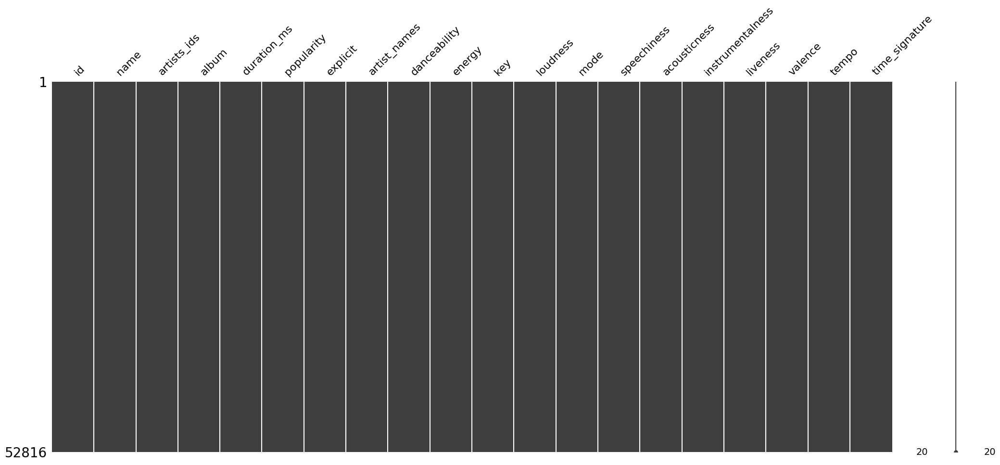

In [6]:
# display msno matrix
msno.matrix(data)

In [7]:
# create dataframe containing only the numerical columns
numerical_data = data.select_dtypes(include=np.number)
numerical_data.drop(['duration_ms'], axis=1, inplace=True)

# standardize the data
# numerical_data = (numerical_data - numerical_data.mean()) / numerical_data.std()
# numerical_data.head()

# normalize the data using StandardScaler
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
numerical_data = scaler.fit_transform(numerical_data)
numerical_data = pd.DataFrame(numerical_data, columns=data.select_dtypes(include=np.number).drop('duration_ms', axis=1).columns)
numerical_data

,popularity,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,2.963447,0.423434,0.374590,-0.331290,0.557702,0.747821,-0.326394,-0.735467,-0.675643,-0.207977,0.314190,-0.683908,0.256197
1,1.629186,0.459149,0.697189,0.794471,0.667621,0.747821,-0.477615,-0.947764,-0.295013,-0.068220,-0.112586,-0.942631,0.256197
2,2.557367,0.821398,0.293940,-1.175611,0.633205,-1.337219,-0.367743,0.046680,-0.675648,-0.647843,-1.025517,-0.653550,0.256197
3,3.137481,0.816296,-0.225024,-0.894171,0.450450,0.747821,0.081194,-1.054321,-0.675636,0.704119,-0.780584,0.415473,0.256197
4,2.731402,1.260178,0.946152,1.638792,0.739789,0.747821,-0.489429,-0.048704,-0.673880,-0.413934,1.312476,-0.361922,0.256197
...,...,...,...,...,...,...,...,...,...,...,...,...,...
52811,-0.633257,0.408128,-0.239050,-0.331290,0.622666,0.747821,0.253681,0.223821,-0.675648,-0.384512,0.755811,-1.309640,0.256197
52812,0.062879,-0.076572,0.167706,0.513031,0.445115,0.747821,-0.550863,-1.066639,-0.484538,-0.149132,-0.758318,-0.746397,0.256197
52813,-0.343200,-0.035755,-0.112815,1.075911,0.087877,0.747821,-0.561495,1.060472,-0.464448,0.762964,1.178877,1.048681,0.256197
52814,-0.691268,-1.005154,0.774333,0.513031,0.435510,-1.337219,-0.455168,-1.087452,-0.664150,0.674697,0.147191,1.667838,0.256197


In [8]:
# show data on a scatter plot using tsne
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, random_state=0)
tsne_obj = tsne.fit_transform(numerical_data)

# create a scatter plot
x, y = tsne_obj.T
fig = px.scatter(x=x, y=y)
fig.show()

In [17]:
# cluster the data using k-means
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=1000, random_state=0, n_init=100, max_iter=1000)
# fit the model on the first 10000 rows
kmeans.fit(numerical_data)

# add the cluster labels to the dataframe
data['cluster'] = kmeans.labels_

# show the clusters on a scatter plot
fig = px.scatter(x=x, y=y, color=data['cluster'])
fig.show()


In [10]:
# extract all datapoints of one cluster
cluster = data[data['cluster'] == 4]
cluster

,id,name,artists_ids,album,duration_ms,popularity,explicit,artist_names,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,cluster
6730,5wZK0hHduZpjWWoT0rq9p4,Something Loud,3Ayl7mCk0nScecqOzvNp6s,Something Loud,196618,52,False,Jimmy Eat World,0.375,0.899,...,-2.667,1,0.0478,0.001510,0.000000,0.357,0.4970,151.932,4,4
7057,4uQeaos1wK3UDNtlYasgys,Chewing Glass,5YFIVhzlaYH9Yadjw9gSUx,Chewing Glass,181666,37,False,James and the Cold Gun,0.386,0.971,...,-4.891,1,0.1500,0.000177,0.094000,0.280,0.1790,153.075,4,4
7094,0YVJiU5WEmYSZvx0t4B92F,From Hell to Here,71NBOcJ9lMeXqnbnya1z0x,From Hell to Here,176106,45,False,HIMALAYAS,0.178,0.728,...,-4.632,1,0.0537,0.000012,0.000006,0.311,0.5260,165.779,4,4
7191,7caD4SRq2jQfbFy2ZfT3iz,I Watched Them Go,57JelvPHs2P6BROjeHhHZ3,I Watched Them Go,199400,33,False,Ultra Q,0.282,0.683,...,-5.123,1,0.0362,0.008890,0.000028,0.439,0.2640,167.901,4,4
7301,0TvVyjWvb13ZMm9aquJkdy,Joy Thief,4docLaOEimvNmjei3CLOzB,Joy Thief,237580,25,False,Dosser,0.391,0.982,...,-5.748,1,0.0909,0.000115,0.012500,0.361,0.0755,149.544,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46457,4IRDVWypOZIcxUOeVhLVCC,Material Boy,74xFFXkvOq9dPDigOWTHiX,Pennybridge Pioneers,143400,42,False,Millencolin,0.364,0.986,...,-2.315,1,0.1300,0.002730,0.000000,0.368,0.5570,140.395,4,4
49831,206aJvufLWSF3RRJJonlFl,Choose A Life,1M684BN2C8BO9WwB0xeXJo,Choose A Life,206798,41,True,Wings of Desire,0.342,0.883,...,-4.667,1,0.0469,0.000275,0.179000,0.472,0.3690,142.092,4,4
49956,588TIiNqDWazxZcxe2hRIE,Back To U - Matrix & Futurebound Remix,41iVQ05he8SrfIWbZQ58N7/20DZAfCuP1TKZl5KcY7z3Q/...,Back To U (Matrix & Futurebound Remix),259396,36,True,SLANDER/Matrix & Futurebound/William Black,0.533,0.919,...,-3.395,1,0.0477,0.000404,0.185000,0.525,0.2300,173.972,4,4
53780,0swq2XxTcYZWbwz24AU8kI,Before I Knew What Love Was,467ZVQDU1RNrX8o6TVF4eU,Constellation Choir,303226,31,False,Everest Cale,0.243,0.851,...,-3.516,1,0.0624,0.182000,0.017600,0.294,0.3270,163.972,4,4


In [11]:
# calculate shilouette score
from sklearn.metrics import silhouette_score
print(silhouette_score(numerical_data, kmeans.labels_))

# calculate the average of each column for each cluster
cluster_means = data.groupby('cluster').mean()
cluster_means

0.09528100150291557


,duration_ms,popularity,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
cluster,,,,,,,,,,,,,,,
0,193210.318182,52.818182,0.590909,0.551182,0.799000,9.363636,-6.418273,0.045455,0.458364,0.188767,0.041854,0.287914,0.605868,99.833455,4.272727
1,237088.718310,54.267606,0.000000,0.509873,0.136834,1.295775,-16.653366,1.000000,0.040261,0.894662,0.036027,0.115623,0.254880,109.742155,4.000000
2,240902.237288,55.203390,0.084746,0.554288,0.784898,8.338983,-5.803085,0.000000,0.053392,0.079510,0.032132,0.267305,0.212941,131.286085,4.000000
3,205265.095238,37.285714,0.166667,0.732690,0.514452,6.547619,-8.293524,1.000000,0.140069,0.333381,0.040884,0.120112,0.560119,86.640190,4.000000
4,221491.814286,43.100000,0.185714,0.324943,0.903714,2.200000,-4.777400,1.000000,0.079854,0.033828,0.055640,0.336014,0.318347,147.822771,4.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,274689.038462,40.442308,0.076923,0.355790,0.827019,8.403846,-6.912635,1.000000,0.060054,0.045663,0.742615,0.162400,0.373960,95.130885,4.000000
996,223967.793103,38.712644,0.160920,0.669494,0.612782,0.839080,-7.800678,1.000000,0.043131,0.090159,0.060468,0.119395,0.202144,121.832655,4.022989
997,199088.097561,54.170732,0.048780,0.397341,0.304171,8.219512,-11.491707,1.000000,0.038680,0.790317,0.018823,0.319585,0.285737,88.515024,4.000000


In [12]:
# # find best performing number of clusters using the elbow method
# from sklearn.cluster import KMeans
# from sklearn.metrics import silhouette_score

# # create a list of the number of clusters to test
# num_clusters = [i for i in range(2, 10000, 100)]

# # create a list to store the silhouette scores
# scores = []

# # loop through the number of clusters
# for i in num_clusters:
#     # create a kmeans model
#     kmeans = KMeans(n_clusters=i, random_state=0)
#     # fit the model
#     kmeans.fit(numerical_data)
#     # calculate the silhouette score
#     score = silhouette_score(numerical_data, kmeans.labels_)
#     # add the score to the list
#     scores.append(score)

# # plot the scores using px
# fig = px.line(x=num_clusters, y=scores)
# fig.show()

In [13]:
# cluster the data using dbscan
from sklearn.cluster import DBSCAN
dbscan = DBSCAN(eps=5, min_samples=20, n_jobs=-1)
dbscan.fit(numerical_data)

# add the cluster labels to the dataframe
data['cluster'] = dbscan.labels_

# show the clusters on a scatter plot
fig = px.scatter(x=x, y=y, color=data['cluster'])
fig.show()

: 

: 

In [23]:
# write an algorithm to find the best performing eps and min_samples values
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score

# create a list of the eps values to test
eps_values = [i/10 for i in range(1, 10)]

# create a list of the min_samples values to test
min_samples_values = [i for i in range(1, 10)]

# create a list to store the silhouette scores
scores = []
n_labels = []

# loop through the eps values
for i in eps_values:
    # loop through the min_samples values
    for j in min_samples_values:
        # create a dbscan model
        dbscan = DBSCAN(eps=i, min_samples=j)
        # fit the model
        dbscan.fit(numerical_data)
        if len(set(dbscan.labels_)) < 2:
            scores.append(2)
            n_labels.append(1)
            continue
        # calculate the silhouette score
        score = silhouette_score(numerical_data, dbscan.labels_)
        # add the score to the list
        scores.append(score)
        n_labels.append(len(set(dbscan.labels_)))

In [25]:
# plot the scores in 3 dimensions using px
# the ith score corresponds to the eps value eps_values[i//len(min_samples_values)] and the min_samples value min_samples_values[i%len(min_samples_values)]
print(eps_values*len(min_samples_values))
print(min_samples_values*len(eps_values))
# make a list that contains all x values len(min_samples_values) times for each eps value
x_large = []
for i in eps_values:
    x_large.extend([i]*len(min_samples_values))
fig = px.scatter_3d(x=x_large, y=min_samples_values*len(eps_values), z=scores)
fig.show()

fig = px.scatter_3d(x=x_large, y=min_samples_values*len(eps_values), z=n_labels)
fig.show()


[0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
[1, 2, 3, 4, 5, 6, 7, 8, 9, 1, 2, 3, 4, 5, 6, 7, 8, 9, 1, 2, 3, 4, 5, 6, 7, 8, 9, 1, 2, 3, 4, 5, 6, 7, 8, 9, 1, 2, 3, 4, 5, 6, 7, 8, 9, 1, 2, 3, 4, 5, 6, 7, 8, 9, 1, 2, 3, 4, 5, 6, 7, 8, 9, 1, 2, 3, 4, 5, 6, 7, 8, 9, 1, 2, 3, 4, 5, 6, 7, 8, 9]


In [14]:
# cluster data using spherical k-means
from sklearn.cluster import MiniBatchKMeans

# create a spherical k-means model
spherical_kmeans = MiniBatchKMeans(n_clusters=10, random_state=0, batch_size=256*12, max_iter=1000, reassignment_ratio=0.01)

# fit the model
spherical_kmeans.fit(numerical_data)

# add the cluster labels to the dataframe
data['cluster'] = spherical_kmeans.labels_

# show the clusters on a scatter plot
fig = px.scatter(x=x, y=y, color=data['cluster'])
fig.show()

In [9]:
# cluster data using affinity propagation
from sklearn.cluster import AffinityPropagation

# create an affinity propagation model
# affinity_propagation = AffinityPropagation(damping=0.9, max_iter=200, convergence_iter=15, copy=True, preference=None, affinity='euclidean', verbose=False)
affinity_propagation = AffinityPropagation()

# fit the model
affinity_propagation.fit(numerical_data)

# add the cluster labels to the dataframe
data['cluster'] = affinity_propagation.labels_

# show the clusters on a scatter plot
fig = px.scatter(x=x, y=y, color=data['cluster'])
fig.show()

MemoryError: Unable to allocate 20.8 GiB for an array with shape (52816, 52816) and data type float64